In [1]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import warnings
warnings.filterwarnings('ignore')

# Set style for plots
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (12, 6)

In [2]:
# url = 'https://en.wikipedia.org/wiki/FTSE_100_Index'
# tables = pd.read_html(url)

# ftse100_df = tables[6]
# tickers = ftse100_df['Ticker'].tolist()
# tickers = [ticker + '.L' for ticker in tickers]  # Yahoo Finance suffix for London Stock Exchange

In [3]:
import pandas as pd
import requests

url = 'https://en.wikipedia.org/wiki/FTSE_100_Index'

# Define a User-Agent header to mimic a web browser
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/100.0.4896.60 Safari/537.36'
}

# Make the request with the headers
try:
    response = requests.get(url, headers=headers)
    response.raise_for_status()  # This will raise an HTTPError for bad responses (4xx or 5xx)
    
    # Pass the content of the response to pandas
    tables = pd.read_html(response.text)
    
    ftse100_df = tables[6]
    tickers = ftse100_df['Ticker'].tolist()
    tickers = [ticker + '.L' for ticker in tickers]  # Yahoo Finance suffix for London Stock Exchange

    print(f"Number of tickers found: {len(tickers)}")

except requests.exceptions.RequestException as e:
    print(f"An error occurred: {e}")

Number of tickers found: 100


In [4]:
# Fetch historical data (e.g., 5 years of daily data)
data = yf.download(tickers, start="2020-01-01", end="2024-12-31", group_by='ticker')

[*********************100%***********************]  100 of 100 completed


In [5]:
data.head()

Ticker           MNDI.L                                                  \
Price              Open         High          Low        Close   Volume   
Date                                                                      
2020-01-02  1949.984125  1968.638961  1940.656585  1941.754028   791400   
2020-01-03  1936.815855  1945.594673  1911.576966  1939.010620  1041977   
2020-01-06  1909.382495  1924.745368  1885.789524  1895.117065   891284   
2020-01-07  1897.859992  1911.576818  1872.072262  1906.090088   817249   
2020-01-08  1886.337807  1900.054633  1880.851077  1893.470581   902562   

Ticker           KGF.L                                                ...  \
Price             Open        High         Low       Close    Volume  ...   
Date                                                                  ...   
2020-01-02  217.040936  222.329753  217.040936  220.733124   4994297  ...   
2020-01-03  219.535624  220.333939  216.242587  218.537735   5635540  ...   
2020-01-06  217.040901  219.136475  215.244698  219.136475   3379455  ...   
2020-01-07  221.132283  227.518768  220.533543  227.518768   6047854  ...   
2020-01-08  225.722544  227.019804  222.229932  223.527191  10157711  ...   

Ticker          LAND.L                                               \
Price             Open        High         Low       Close   Volume   
Date                                                                  
2020-01-02  989.251696  998.226762  987.257237  991.246155  2178147   
2020-01-03  987.257432  989.451350  980.875138  986.659119  2568563   
2020-01-06  983.667339  983.667339  972.498354  980.276733  2417311   
2020-01-07  989.650715  994.034532  981.672878  990.448486  1728421   
2020-01-08  991.046700  991.839480  967.512107  976.088257  2450023   

Ticker           VOD.L                                                
Price             Open        High         Low       Close    Volume  
Date                                                                  
2020-01-02  145.678803  148.029426  145.429797  147.212692  36311969  
2020-01-03  146.854129  148.129042  146.107109  147.352142  36311232  
2020-01-06  146.395951  147.033407  145.184795  146.495560  32678727  
2020-01-07  147.113101  148.646990  145.678820  146.077240  46548901  
2020-01-08  145.758485  147.033398  144.901902  146.913879  44317571  

[5 rows x 500 columns]

In [6]:
# Step 1: Calculate Mid prices for each ticker
mid_prices = pd.concat([
    ((data[ticker]['Open'] + data[ticker]['Close']) / 2).rename(ticker)
    for ticker in tickers
], axis=1)

# Step 2: Drop rows with missing values (optional)
mid_prices = mid_prices.dropna()

In [7]:
mid_prices.head()

,III.L,ADM.L,AAF.L,ALW.L,AAL.L,ANTO.L,AHT.L,ABF.L,AZN.L,AUTO.L,...,STJ.L,TW.L,TSCO.L,ULVR.L,UU.L,UTG.L,VOD.L,WEIR.L,WTB.L,WPP.L
Date,,,,,,,,,,,,,,,,,,,,,
2022-07-18,1193.616181,1770.288509,158.555060,930.801915,2574.944204,1028.609922,3871.105040,1611.763859,11140.143039,584.318380,...,1151.496766,118.416243,259.682190,3875.865091,1026.843683,1151.705520,129.199156,1385.705169,2643.169258,805.614230
2022-07-19,1189.619075,1732.080647,162.050774,929.303141,2552.170129,1029.858952,3887.594751,1639.992147,11113.163181,586.617211,...,1154.743272,119.438792,260.281481,3891.598026,1044.819043,1155.201584,130.067017,1392.201491,2647.665252,820.790009
2022-07-20,1200.361235,1734.577802,163.998356,942.792967,2583.270426,1053.344302,4023.010463,1673.716167,11072.193479,597.711850,...,1164.982199,121.334243,261.230313,3911.575576,1051.060304,1166.189236,130.096950,1414.438670,2689.628375,851.041690
2022-07-21,1223.593920,1744.566886,165.945963,952.785571,2563.434680,1043.350499,4103.461353,1692.452116,10782.396373,609.006414,...,1171.225381,124.177444,260.081712,3888.601193,1057.301904,1170.184887,128.690434,1465.159516,2679.137371,863.821325
2022-07-22,1244.578305,1741.819725,165.496514,953.285102,2591.841511,1064.087686,4159.926540,1692.951516,10762.410267,613.304506,...,1182.712879,125.474325,259.832030,3906.580887,1066.788897,1196.655123,128.750265,1492.144054,2674.142263,864.919578


In [8]:
# Step 3: Transpose so that each row is a ticker and columns are dates
data_for_clustering = mid_prices.T.copy()

data_for_clustering.head()

Date,2022-07-18,2022-07-19,2022-07-20,2022-07-21,2022-07-22,2022-07-25,2022-07-26,2022-07-27,2022-07-28,2022-07-29,...,2024-12-10,2024-12-12,2024-12-13,2024-12-18,2024-12-19,2024-12-20,2024-12-23,2024-12-24,2024-12-27,2024-12-30
III.L,1193.616181,1189.619075,1200.361235,1223.593920,1244.578305,1227.091423,1213.601470,1214.100990,1239.332379,1262.315293,...,3634.626814,3632.127043,3639.126400,3640.626273,3564.634047,3537.636769,3540.136601,3575.633081,3596.130808,3580.132620
ADM.L,1770.288509,1732.080647,1734.577802,1744.566886,1741.819725,1733.329142,1759.050696,1803.501433,1858.190961,1901.393246,...,2669.768238,2646.774687,2639.776439,2611.784197,2603.786295,2595.788467,2605.286032,2625.780321,2619.782030,2614.283596
AAF.L,158.555060,162.050774,163.998356,165.945963,165.496514,166.445380,170.340574,171.489145,165.446579,158.405237,...,106.382556,106.132595,106.982454,106.332565,104.882798,104.682834,107.232414,110.381901,112.481552,113.381405
ALW.L,930.801915,929.303141,942.792967,952.785571,953.285102,957.282169,942.293396,945.790743,961.279134,970.772059,...,1278.785721,1278.785721,1280.785357,1252.790053,1242.791672,1246.791121,1249.790467,1251.790314,1241.791964,1244.791370
AAL.L,2574.944204,2552.170129,2583.270426,2563.434680,2591.841511,2634.695461,2698.610025,2703.507968,2785.298757,2861.947335,...,2454.477706,2491.503322,2441.236821,2378.465032,2311.524568,2285.778301,2286.759206,2314.957531,2298.529124,2287.249729


In [9]:
# Calculate percentage difference with respect to the first column (first date)
df_pct_diff = ((data_for_clustering.T - data_for_clustering.T.iloc[0]) / data_for_clustering.T.iloc[0]) * 100

# Transpose back to original format: Tickers as rows, Dates as columns
df_pct_diff = df_pct_diff.T

# Optional: round values for better readability
df_pct_diff = df_pct_diff.round(2)


In [10]:
df_pct_diff.head()

Date,2022-07-18,2022-07-19,2022-07-20,2022-07-21,2022-07-22,2022-07-25,2022-07-26,2022-07-27,2022-07-28,2022-07-29,...,2024-12-10,2024-12-12,2024-12-13,2024-12-18,2024-12-19,2024-12-20,2024-12-23,2024-12-24,2024-12-27,2024-12-30
III.L,0.0,-0.33,0.57,2.51,4.27,2.80,1.67,1.72,3.83,5.76,...,204.51,204.30,204.88,205.01,198.64,196.38,196.59,199.56,201.28,199.94
ADM.L,0.0,-2.16,-2.02,-1.45,-1.61,-2.09,-0.63,1.88,4.97,7.41,...,50.81,49.51,49.12,47.53,47.08,46.63,47.17,48.32,47.99,47.68
AAF.L,0.0,2.20,3.43,4.66,4.38,4.98,7.43,8.16,4.35,-0.09,...,-32.90,-33.06,-32.53,-32.94,-33.85,-33.98,-32.37,-30.38,-29.06,-28.49
ALW.L,0.0,-0.16,1.29,2.36,2.42,2.84,1.23,1.61,3.27,4.29,...,37.39,37.39,37.60,34.59,33.52,33.95,34.27,34.49,33.41,33.73
AAL.L,0.0,-0.88,0.32,-0.45,0.66,2.32,4.80,4.99,8.17,11.15,...,-4.68,-3.24,-5.19,-7.63,-10.23,-11.23,-11.19,-10.10,-10.73,-11.17


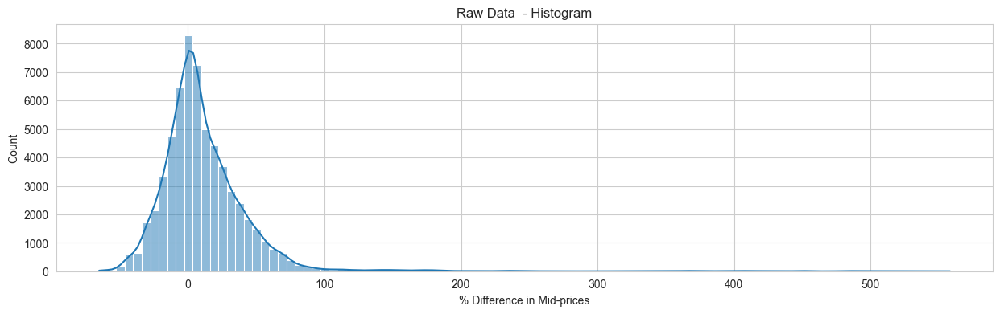

In [11]:
plt.figure(figsize=(15, 4))
sns.histplot(df_pct_diff.values.flatten(), bins=100, kde=True)
plt.title(f'{"Raw Data"}  - Histogram')
plt.xlabel("% Difference in Mid-prices")
plt.show()

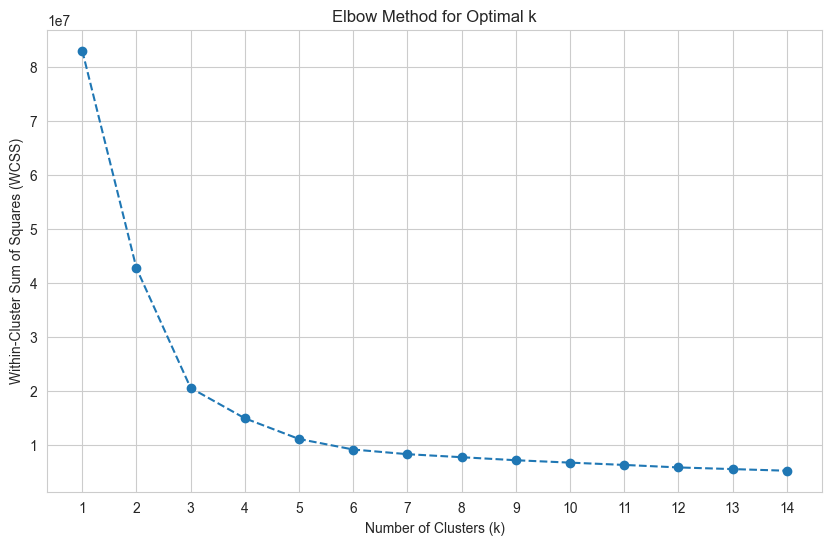

In [12]:
# Implement the Elbow Method
wcss = []  # Within-cluster sum of squares
k_range = range(1, 15)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_pct_diff)
    wcss.append(kmeans.inertia_)

# Plot the Elbow Method results
plt.figure(figsize=(10, 6))
plt.plot(k_range, wcss, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.xticks(k_range)
plt.grid(True)

In [13]:
# Step 4: Clustering Algorithms
from sklearn.cluster import Birch

# Choose optimal k based on the elbow (assume 4 here)
optimal_k = 10

# Fit clustering models
kmeans = KMeans(n_clusters=optimal_k, random_state=42).fit(df_pct_diff)
gmm = GaussianMixture(n_components=optimal_k, random_state=42).fit(df_pct_diff)
dbscan = DBSCAN(eps=2.5, min_samples=3).fit(df_pct_diff)
agglo = AgglomerativeClustering(n_clusters=optimal_k).fit(df_pct_diff)
birch = Birch(n_clusters=optimal_k).fit(df_pct_diff)

# Step 5: Evaluation Metrics
def evaluate_clustering(data, labels, name):
    if len(set(labels)) <= 1:
        print(f"{name} clustering resulted in 1 or fewer clusters. Skipping metrics.\n")
        return
    print(f"Results for {name}:")
    print(f"Silhouette Score (Higher is better): {silhouette_score(data, labels):.3f}")
    print(f"Davies-Bouldin Index (Lower is better): {davies_bouldin_score(data, labels):.3f}")
    print(f"Calinski-Harabasz Score (Higher is better): {calinski_harabasz_score(data, labels):.3f}\n")

evaluate_clustering(df_pct_diff, kmeans.labels_, "KMeans")
evaluate_clustering(df_pct_diff, gmm.predict(df_pct_diff), "GMM")
evaluate_clustering(df_pct_diff, dbscan.labels_, "DBSCAN")
evaluate_clustering(df_pct_diff, agglo.labels_, "Agglomerative")
evaluate_clustering(df_pct_diff, birch.labels_, "Birch")

# Step 6: Visualize stock trends by cluster
def plot_clusters_trend(df, labels, title_prefix):
    df_copy = df.copy()
    df_copy['Cluster'] = labels
    for cluster_id in sorted(df_copy['Cluster'].unique()):
        cluster_members = df_copy[df_copy['Cluster'] == cluster_id].drop(columns='Cluster')
        plt.figure(figsize=(14, 5))
        for i in range(len(cluster_members)):
            plt.plot(cluster_members.columns, cluster_members.iloc[i], alpha=0.4)
        plt.title(f"{title_prefix} - Cluster {cluster_id} Trends")
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()


Results for KMeans:
Silhouette Score (Higher is better): 0.208
Davies-Bouldin Index (Lower is better): 1.122
Calinski-Harabasz Score (Higher is better): 110.716

Results for GMM:
Silhouette Score (Higher is better): 0.208
Davies-Bouldin Index (Lower is better): 1.122
Calinski-Harabasz Score (Higher is better): 110.716

DBSCAN clustering resulted in 1 or fewer clusters. Skipping metrics.

Results for Agglomerative:
Silhouette Score (Higher is better): 0.211
Davies-Bouldin Index (Lower is better): 1.005
Calinski-Harabasz Score (Higher is better): 110.537

Results for Birch:
Silhouette Score (Higher is better): 0.211
Davies-Bouldin Index (Lower is better): 1.005
Calinski-Harabasz Score (Higher is better): 110.537



# KMeans

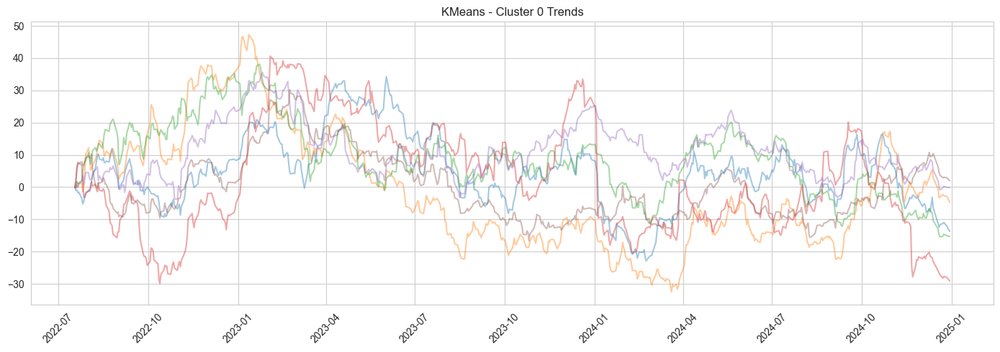

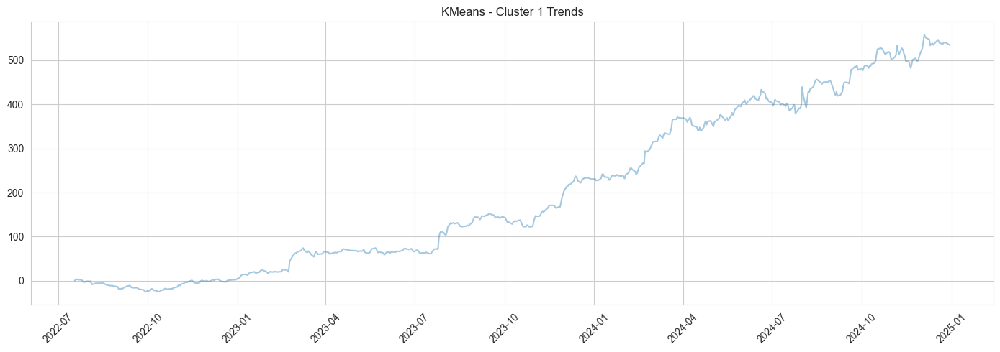

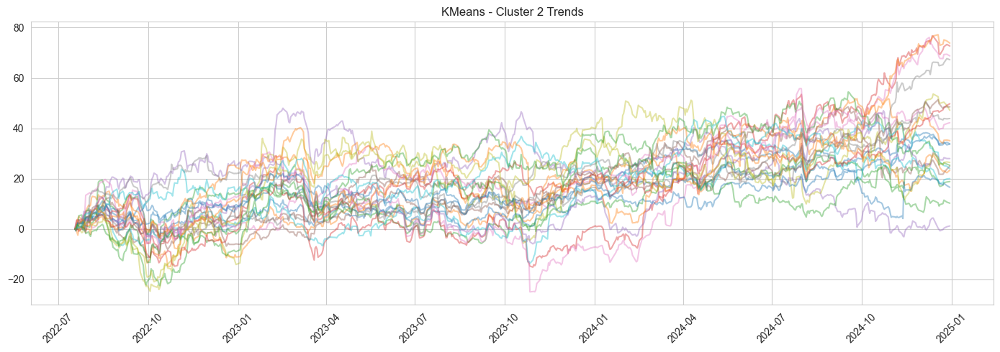

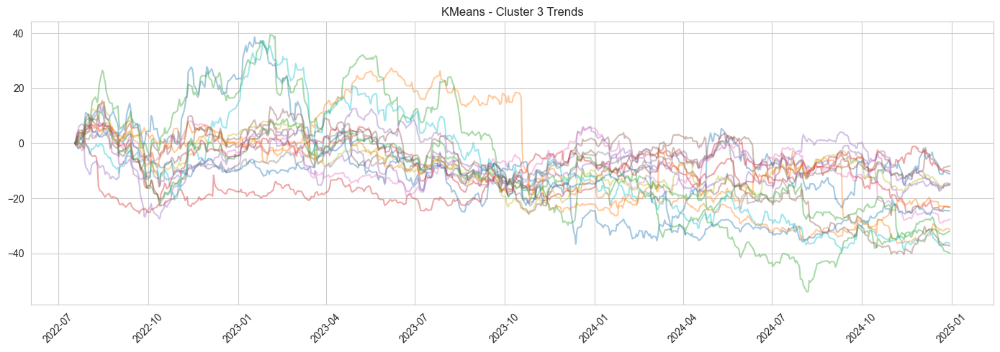

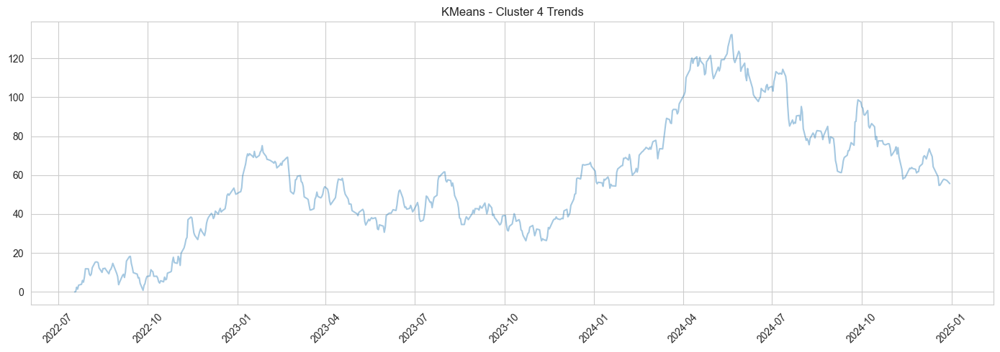

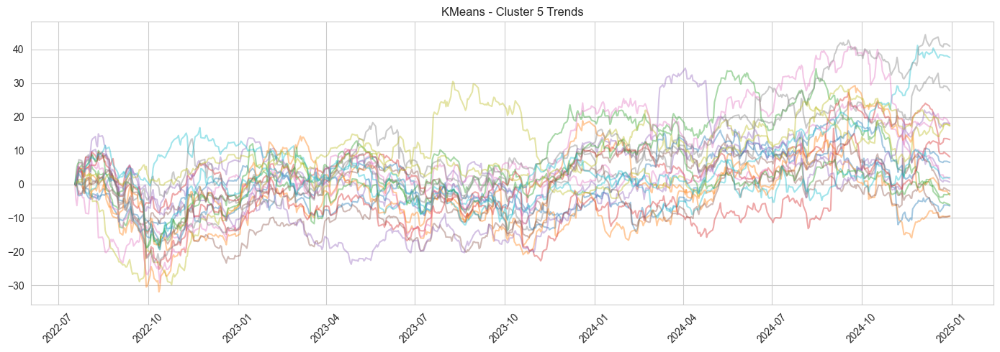

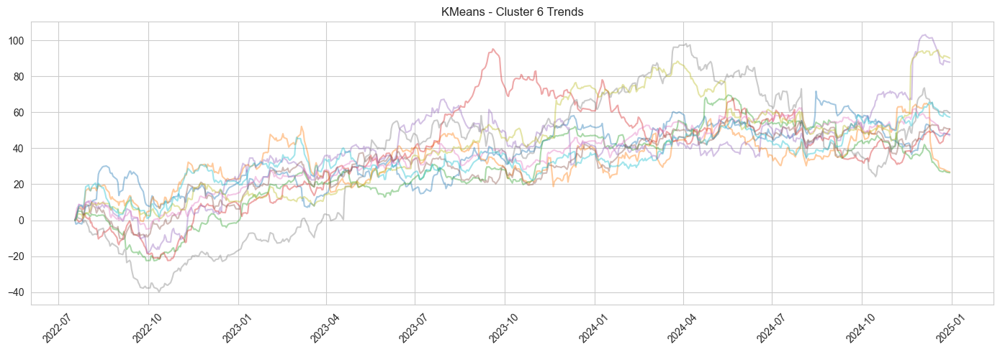

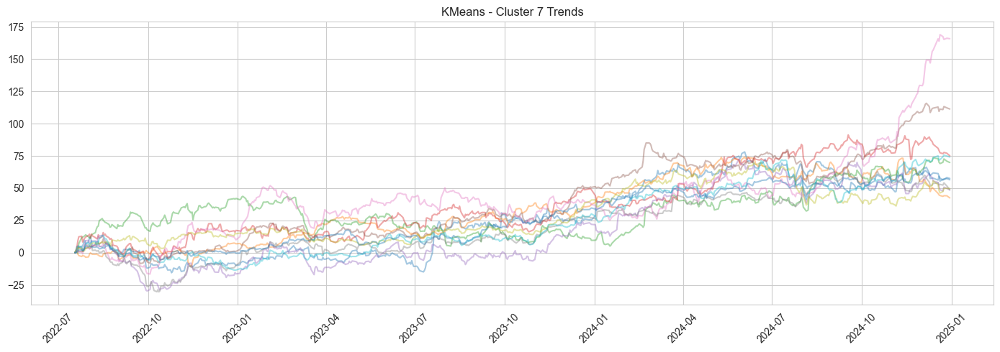

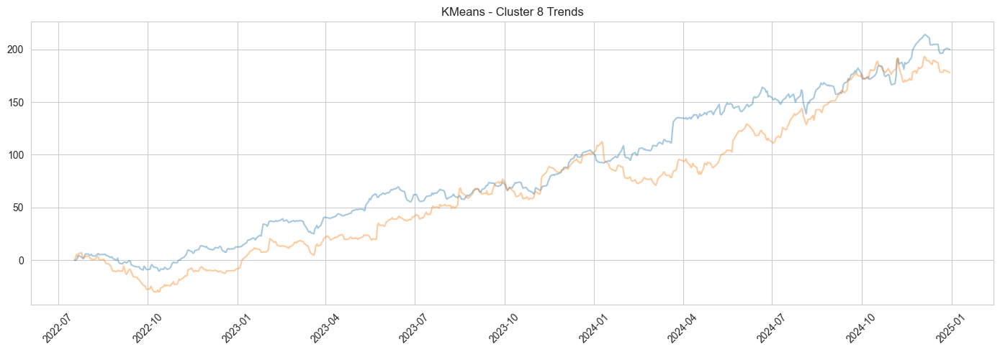

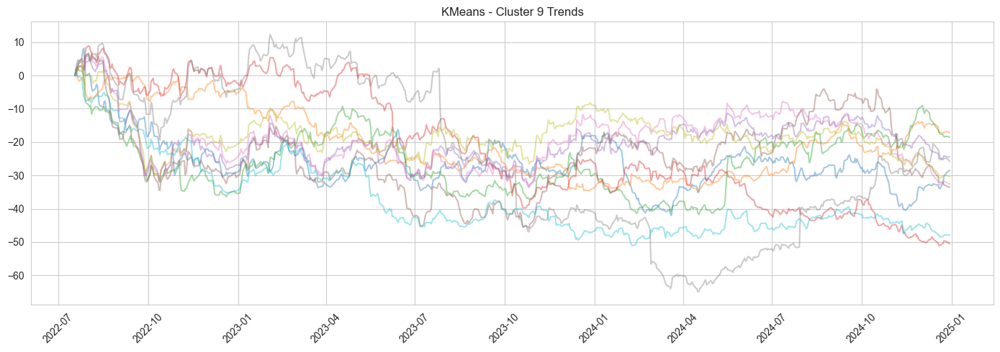

In [14]:
# Example: Visualize KMeans clusters
plot_clusters_trend(df_pct_diff, kmeans.labels_, "KMeans")

# Agglo

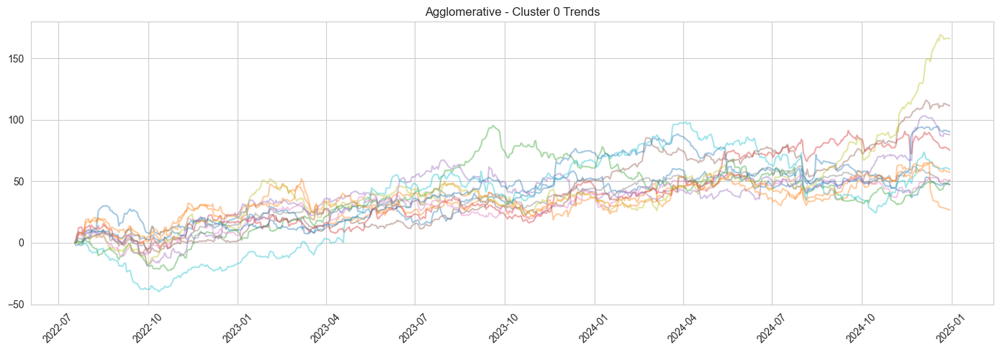

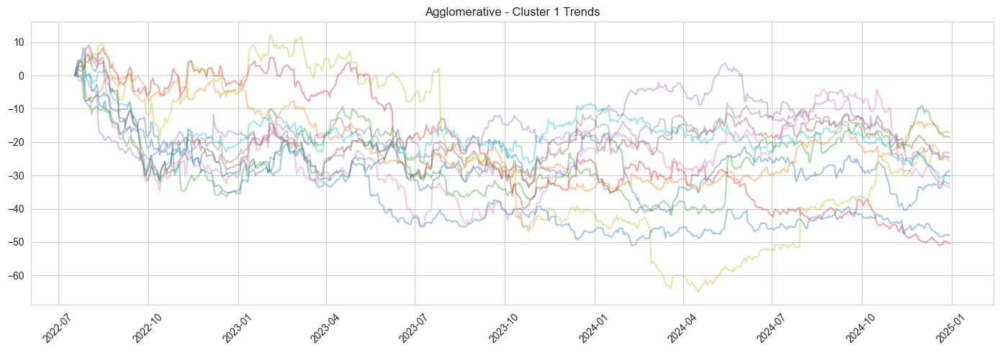

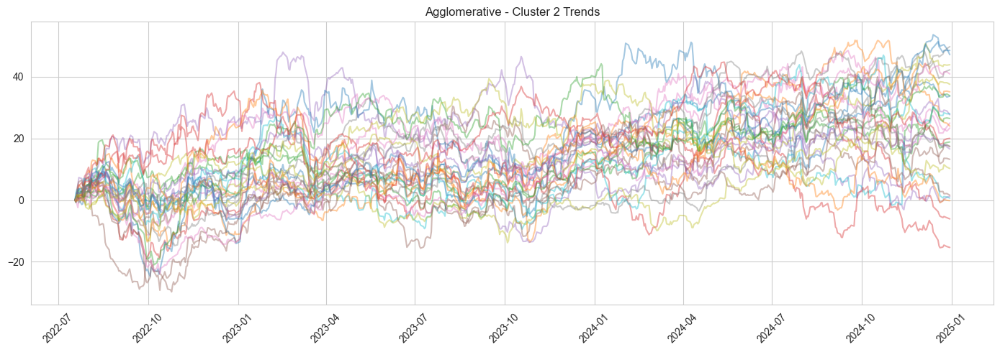

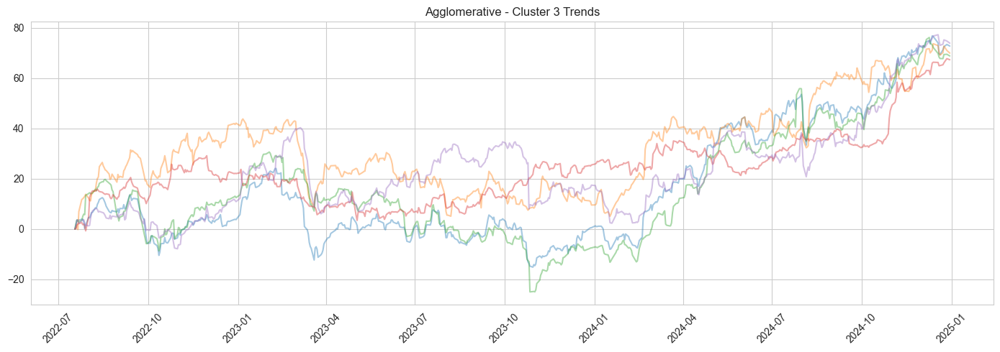

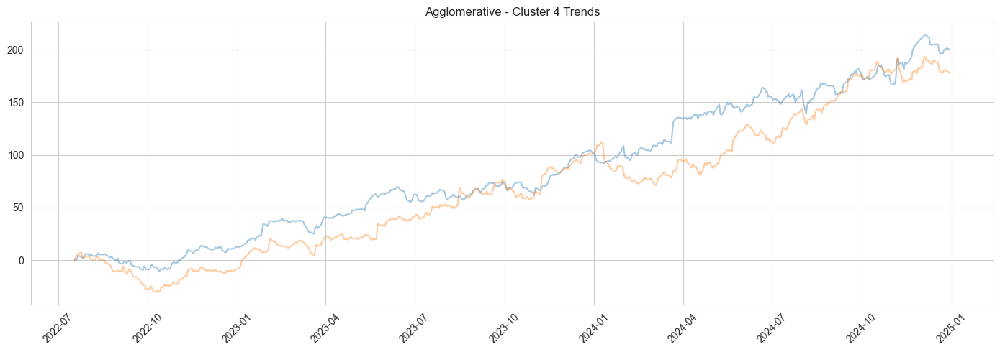

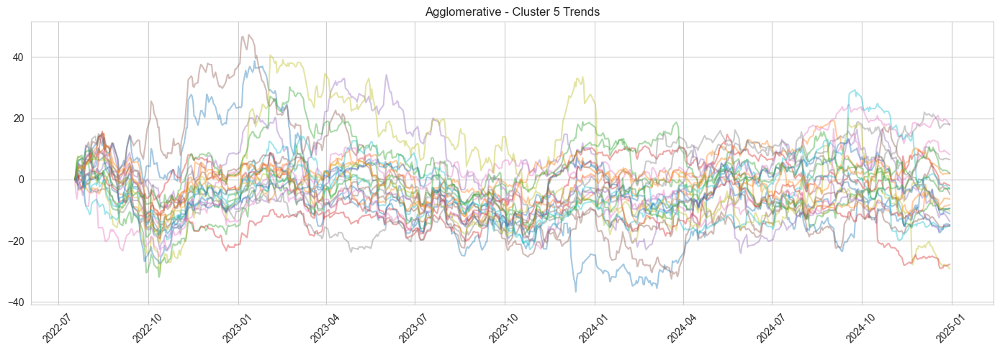

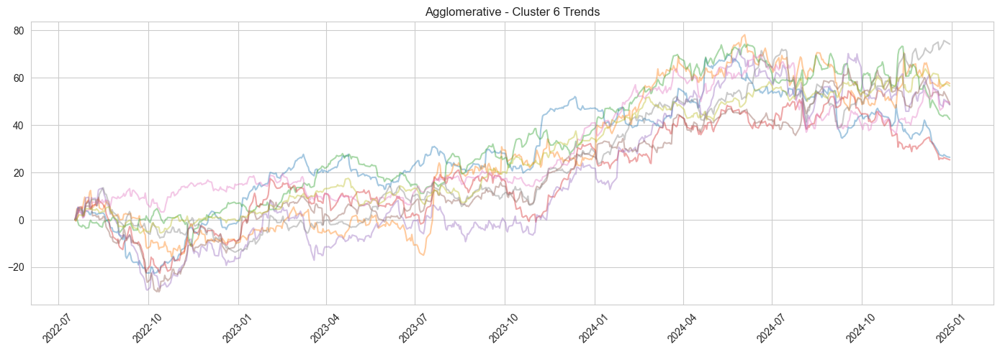

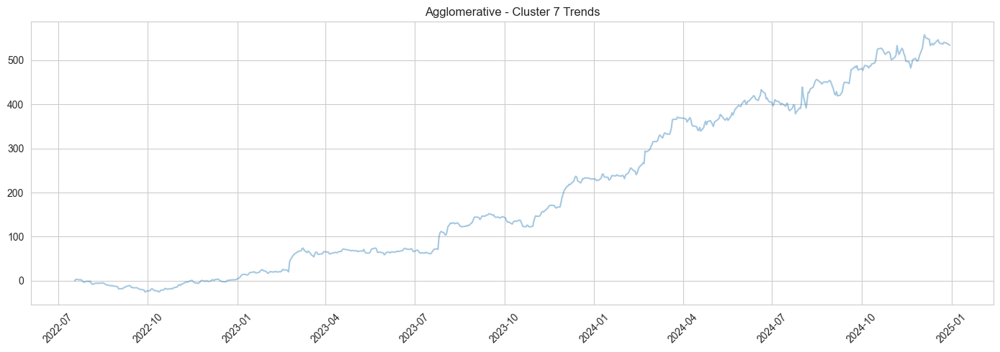

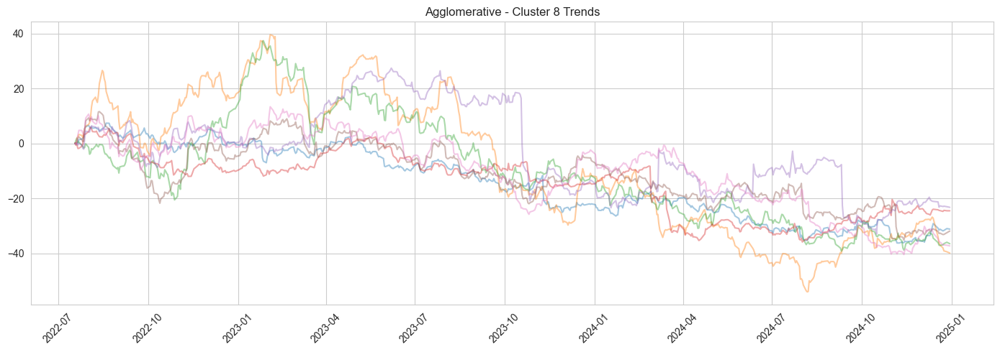

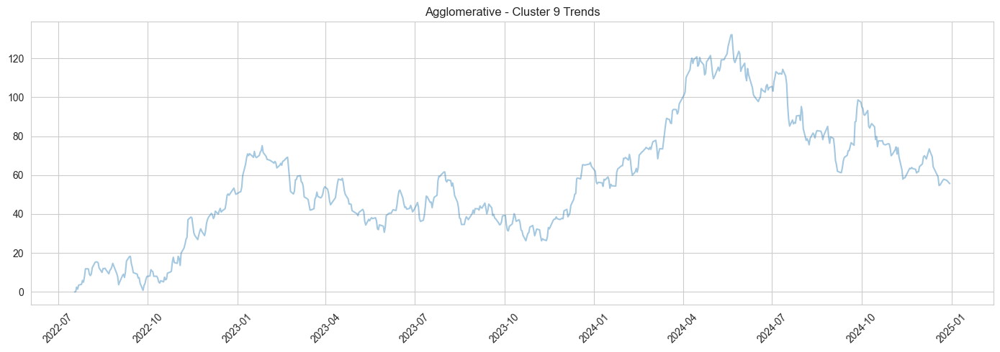

In [15]:
# Example: Visualize KMeans clusters
plot_clusters_trend(df_pct_diff, agglo.labels_, "Agglomerative")

# GMM

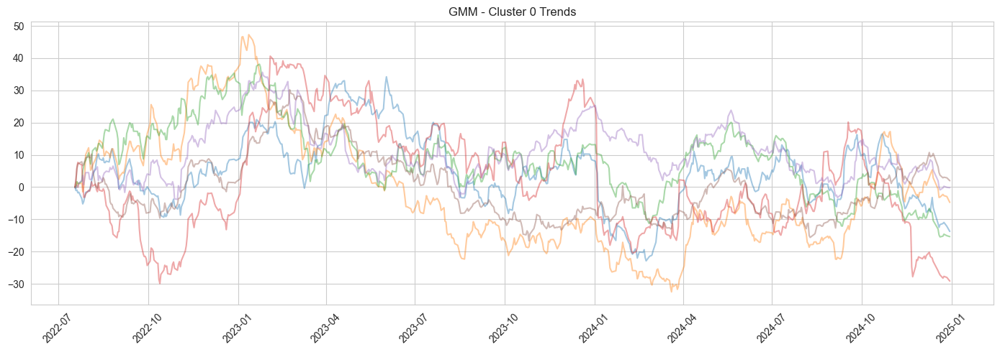

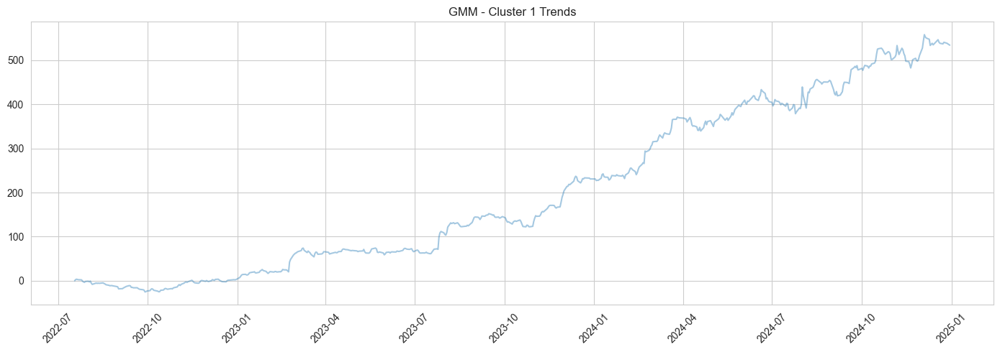

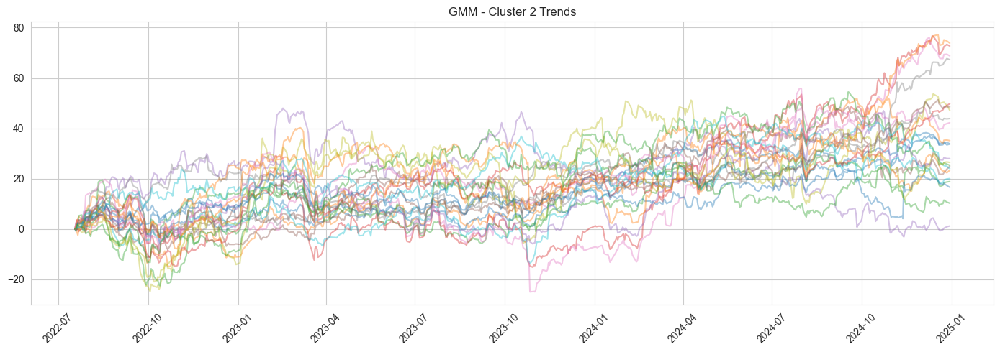

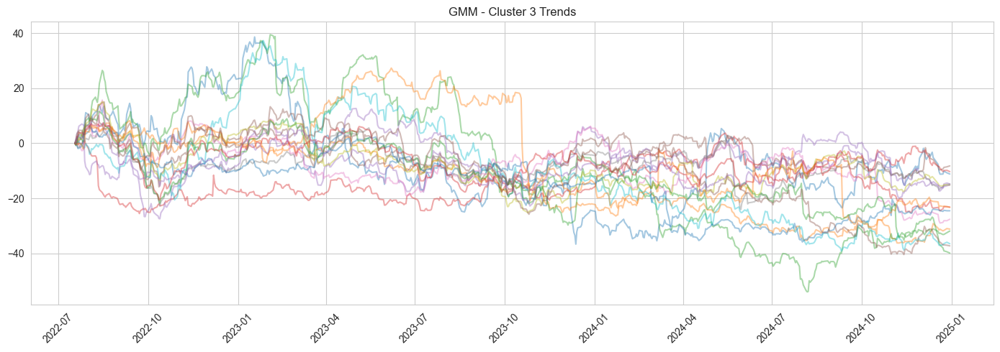

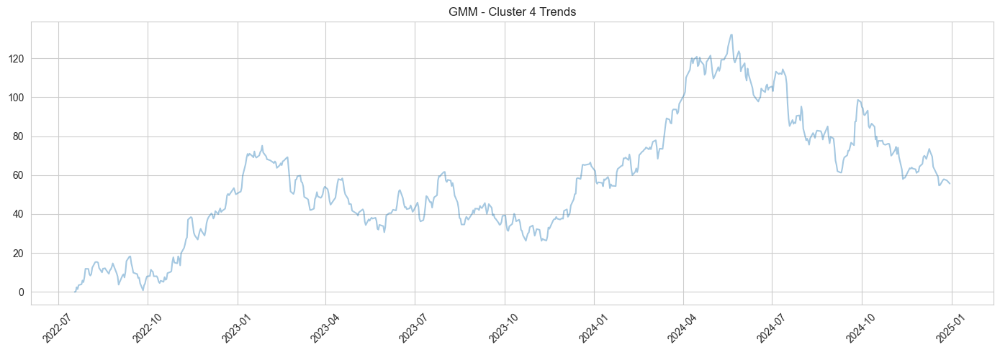

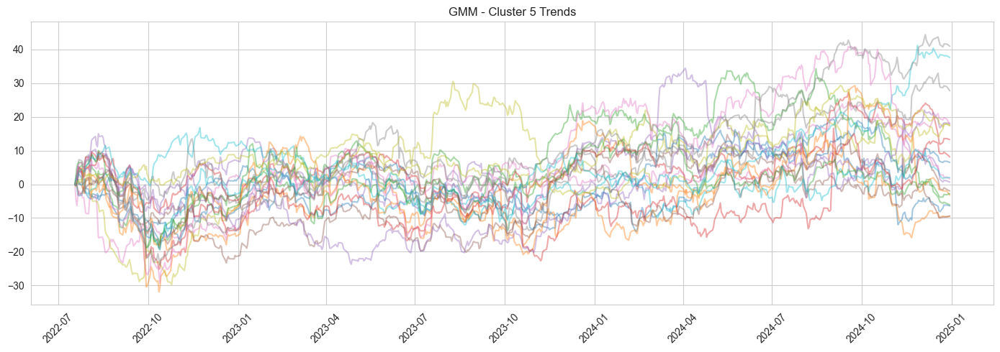

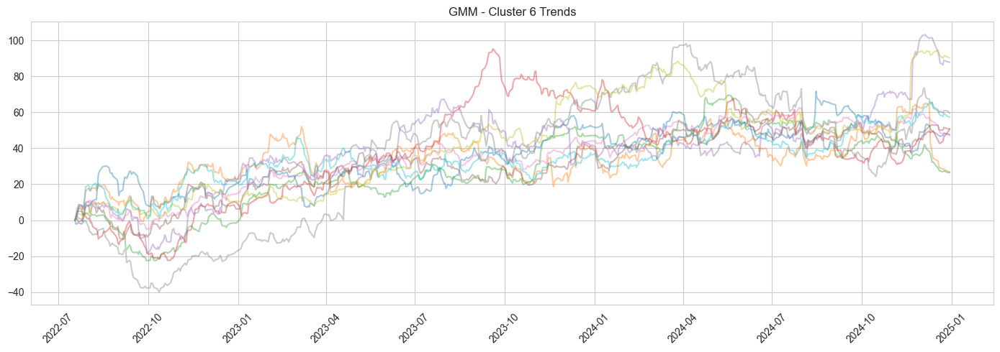

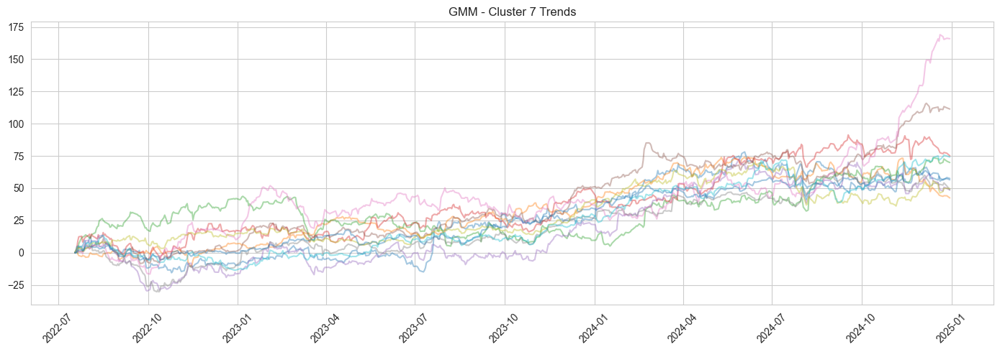

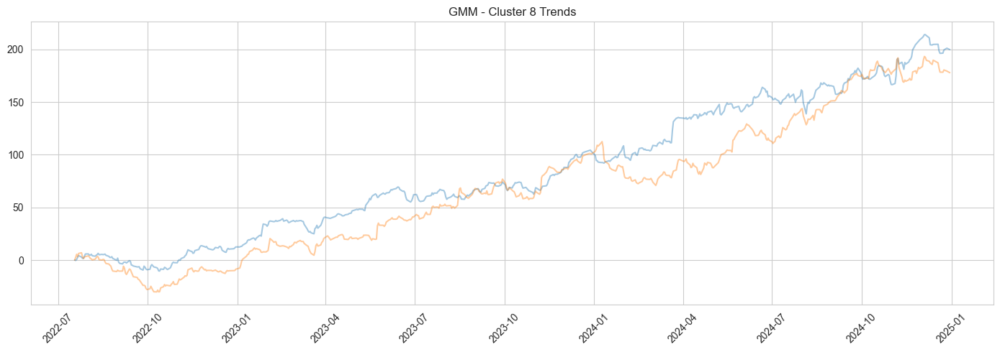

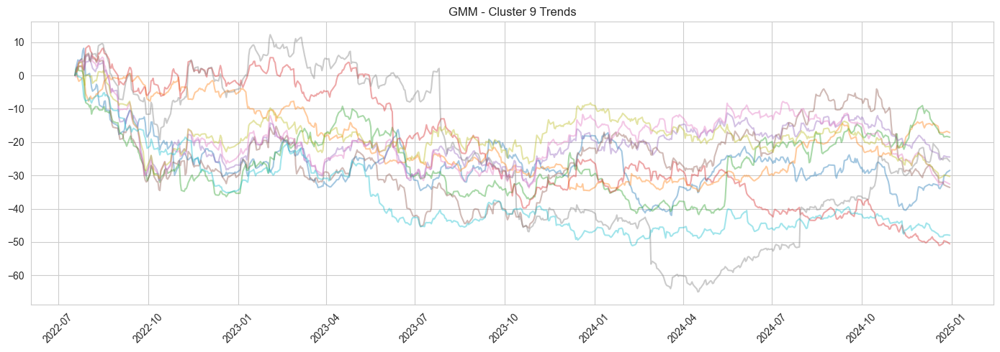

In [16]:
# Example: Visualize KMeans clusters
plot_clusters_trend(df_pct_diff, gmm.predict(df_pct_diff), "GMM")

# Birch

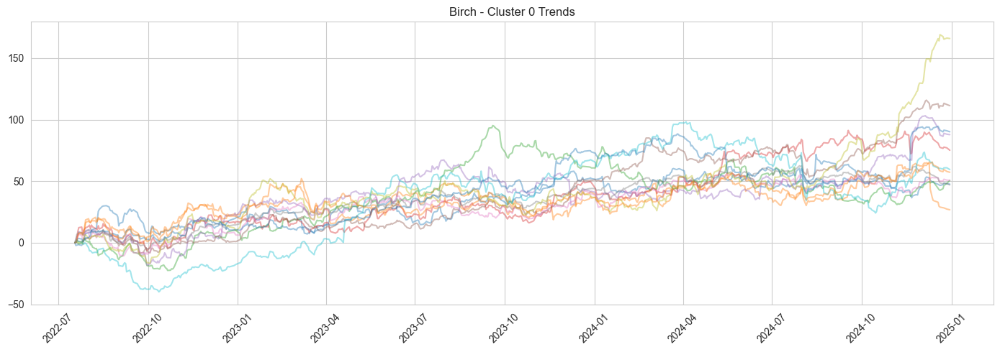

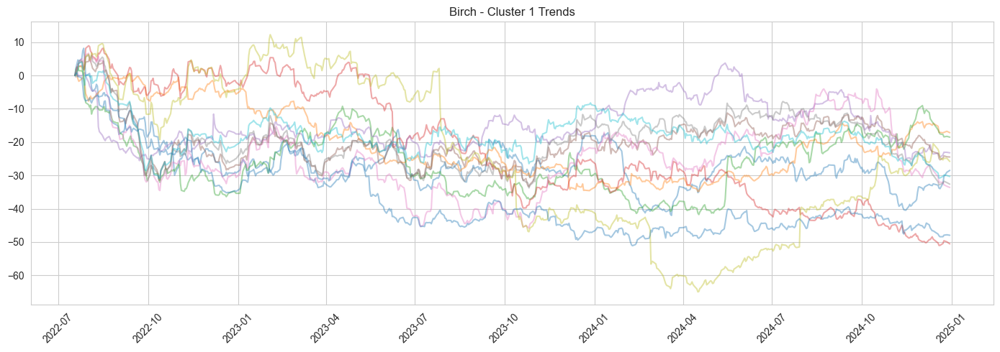

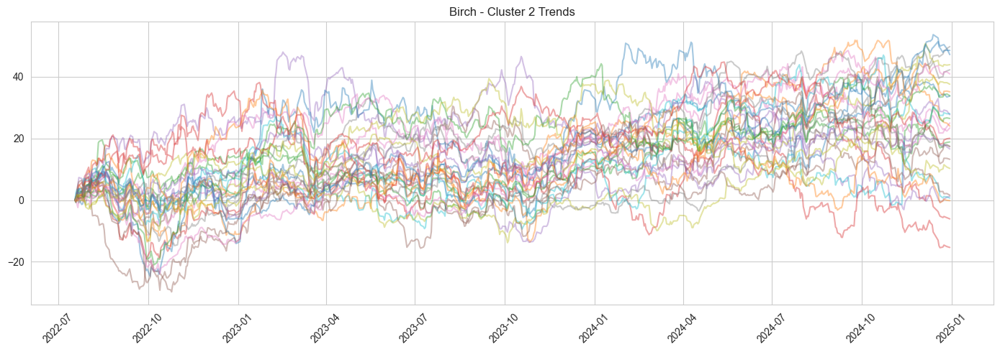

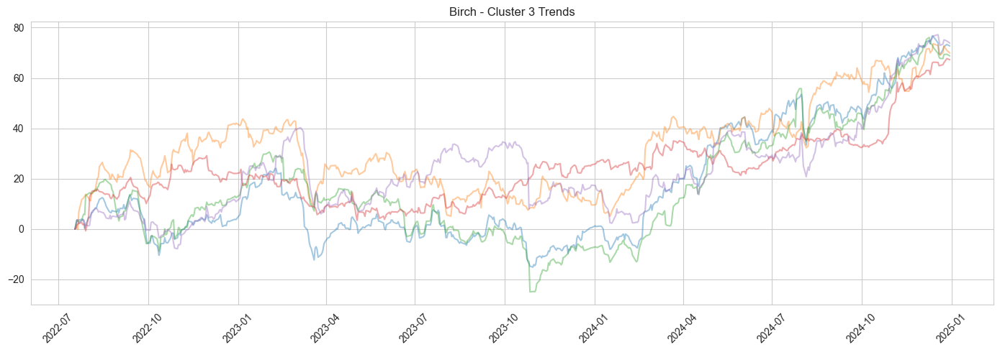

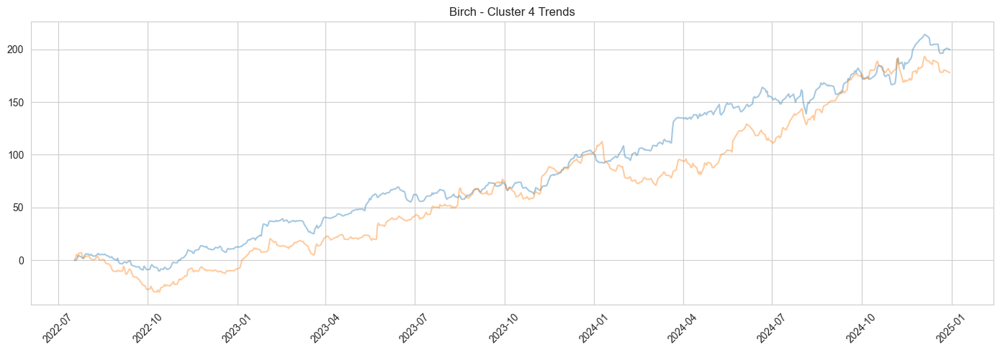

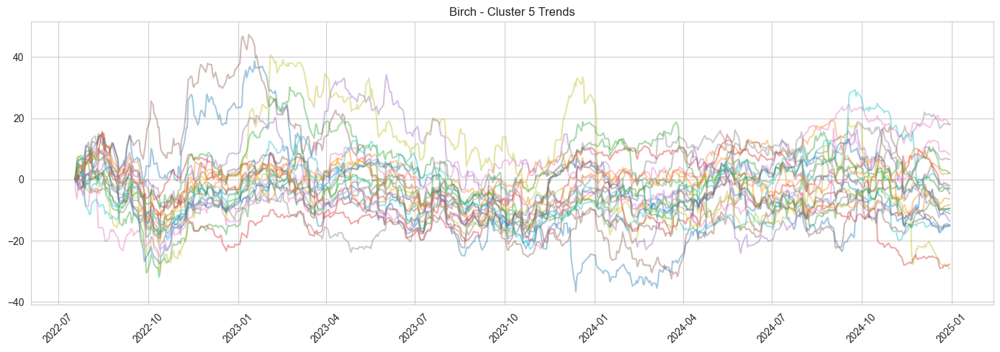

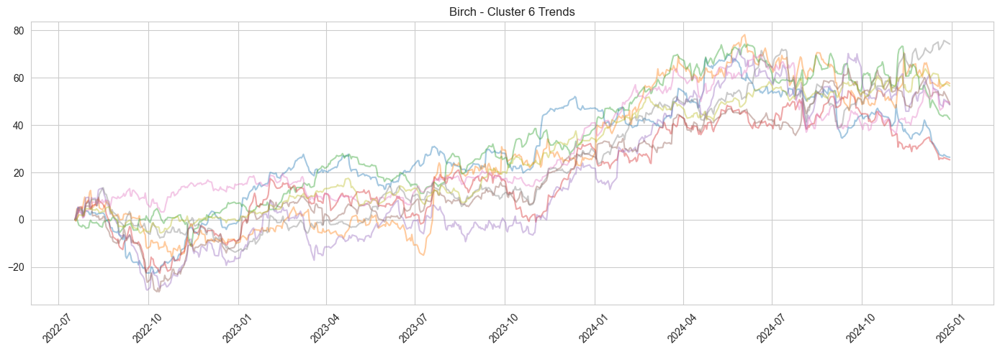

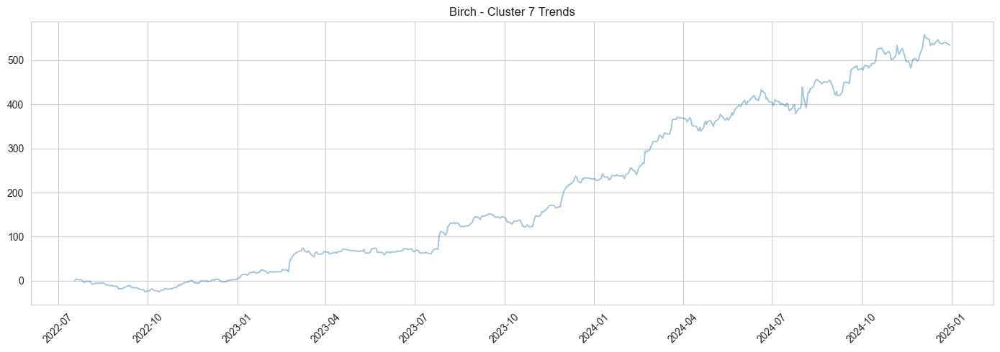

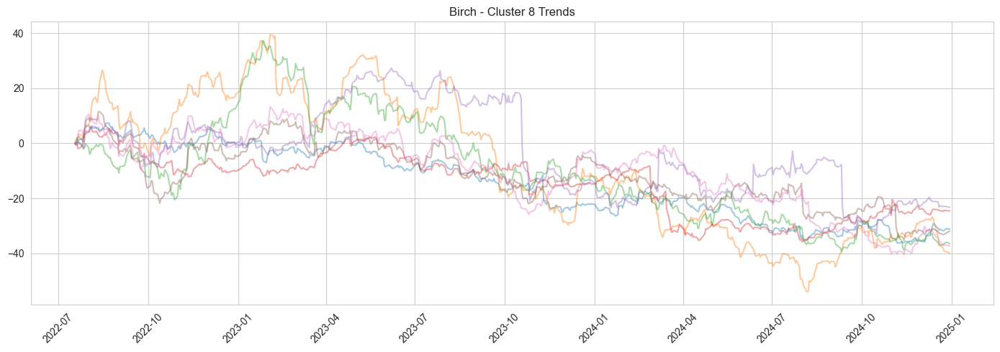

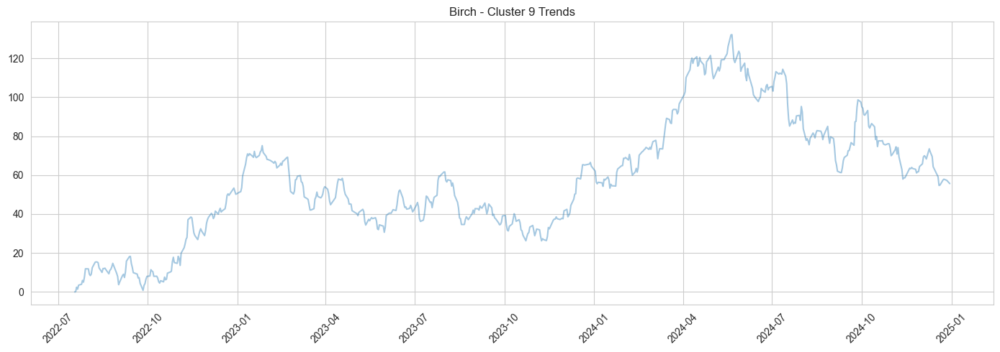

In [17]:
# Example: Visualize KMeans clusters
plot_clusters_trend(df_pct_diff, birch.labels_, "Birch")

# Cluster Visualization

In [18]:
from sklearn.manifold import TSNE
import umap.umap_ as umap

tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(df_pct_diff)

umap_model = umap.UMAP(random_state=42)
X_umap = umap_model.fit_transform(df_pct_diff)

def plot_clusters_2D(X_proj, labels, method_name, reduction="t-SNE"):
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=X_proj[:, 0], y=X_proj[:, 1], hue=labels, palette='tab10', s=30)
    plt.title(f'{method_name} Clusters Visualized with {reduction}')
    plt.grid(True)
    plt.show()

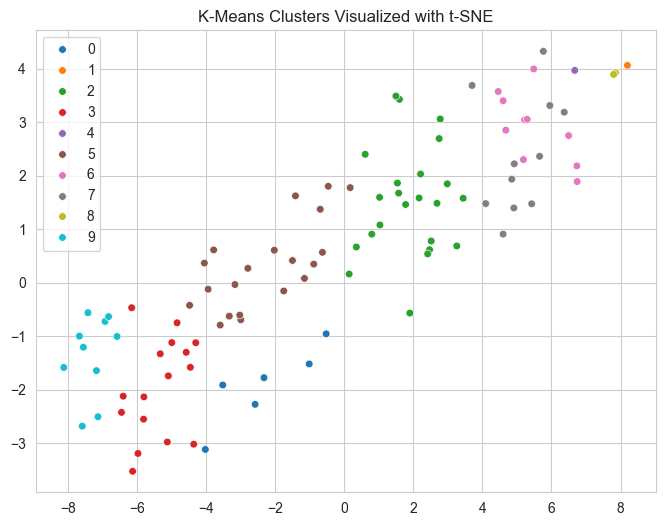

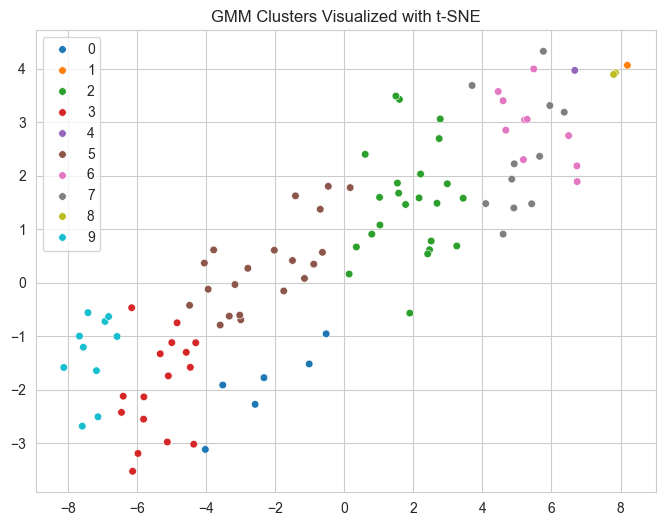

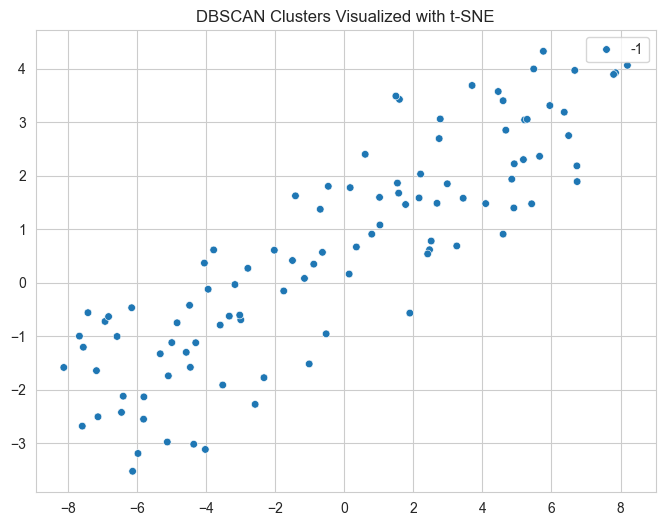

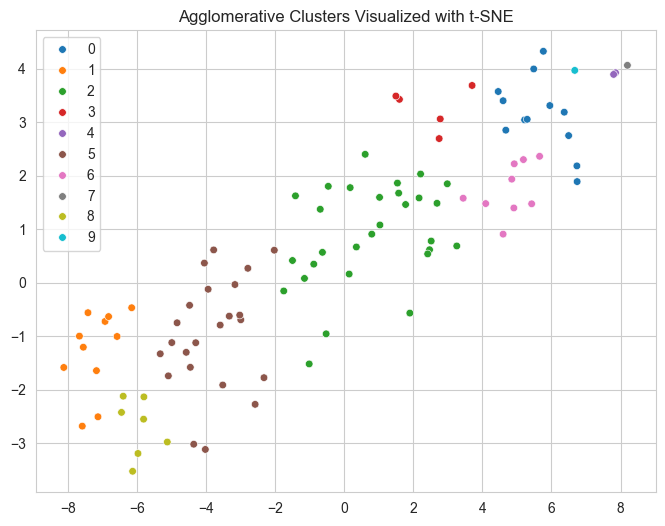

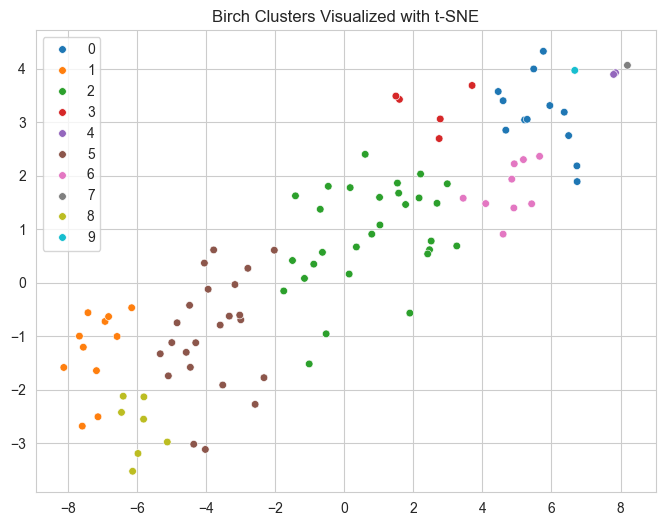

In [19]:
plot_clusters_2D(X_tsne, kmeans.labels_, "K-Means", "t-SNE")
plot_clusters_2D(X_tsne, gmm.predict(df_pct_diff), "GMM", "t-SNE")
plot_clusters_2D(X_tsne, dbscan.labels_, "DBSCAN", "t-SNE")
plot_clusters_2D(X_tsne, agglo.labels_, "Agglomerative", "t-SNE")
plot_clusters_2D(X_tsne, birch.labels_, "Birch", "t-SNE")

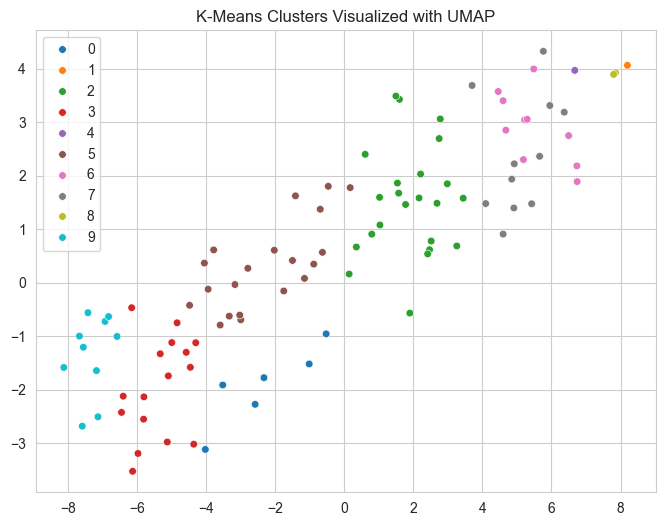

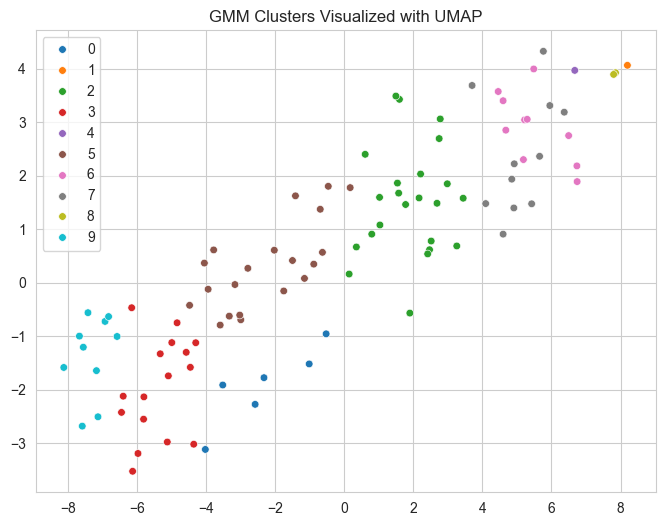

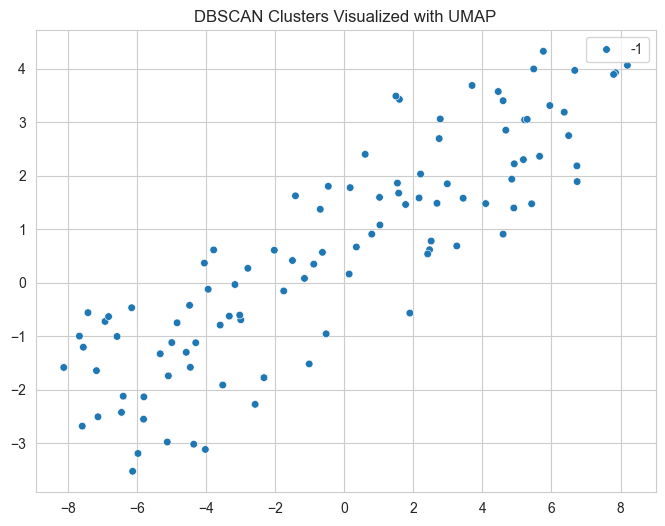

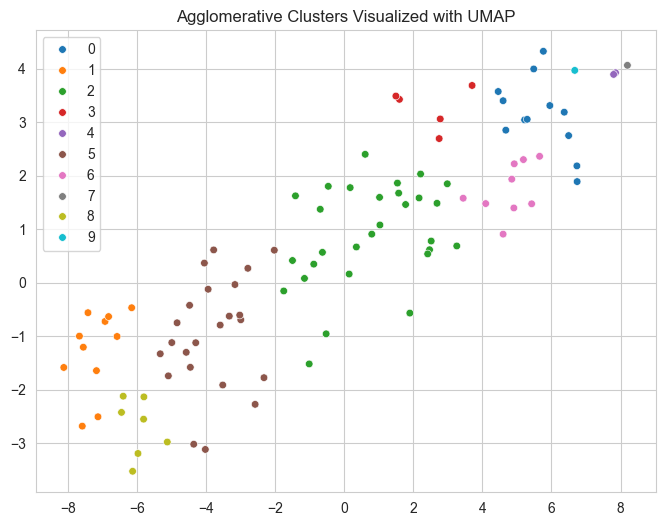

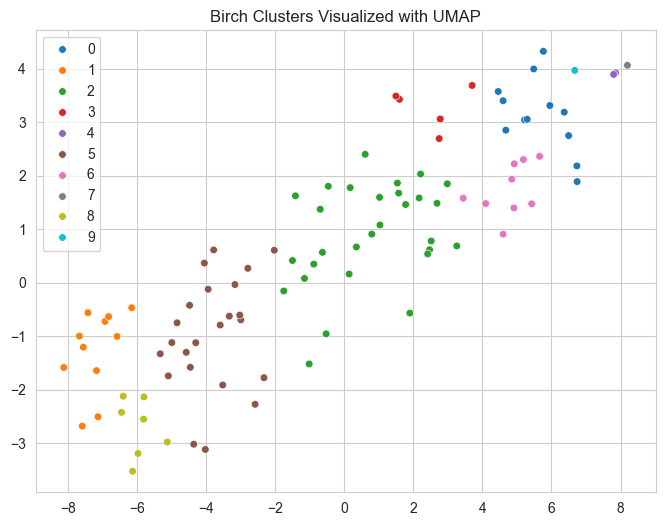

In [20]:
plot_clusters_2D(X_tsne, kmeans.labels_, "K-Means", "UMAP")
plot_clusters_2D(X_tsne, gmm.predict(df_pct_diff), "GMM", "UMAP")
plot_clusters_2D(X_tsne, dbscan.labels_, "DBSCAN", "UMAP")
plot_clusters_2D(X_tsne, agglo.labels_, "Agglomerative", "UMAP")
plot_clusters_2D(X_tsne, birch.labels_, "Birch", "UMAP")